In [38]:
import scanpy as sc
import loompy
import scvelo as scv
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt

In [2]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization



In [3]:
cd '/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Male/8W_Control_vs_8W_HF'

/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Male/8W_Control_vs_8W_HF


In [4]:
adata = sc.read('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/taPVAT_combined_annotated_with_immune_fibro_ecs_all_genes_unnormalized.h5ad')

In [5]:
adata.obs.celltype_broad.unique()

['Fibroblasts', 'Adipocytes', 'Immune_Cells', 'Endothelial_Cells', 'Pericytes', 'Mesothelial_Cells', 'Neuronal_Cells', 'SMCs']
Categories (8, object): ['Adipocytes', 'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells', 'Mesothelial_Cells', 'Neuronal_Cells', 'Pericytes', 'SMCs']

In [6]:

# This has data from all celltypes, not just brown adipocytes
ldata_8W_Control_Male = scv.read('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Loom_Files/Control_Male_8W.loom', cache=False)
# This has data from all celltypes, not just brown adipocytes
ldata_8W_HF_Male = scv.read('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Loom_Files/HF_Male_8W.loom', cache=False)




In [7]:
adata_8W_Control_Males = scv.utils.merge(adata, ldata_8W_Control_Male)
adata_8W_HF_Males = scv.utils.merge(adata, ldata_8W_HF_Male)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [8]:
# Merge along observations (add cells)
adata = ad.concat([adata_8W_Control_Males, adata_8W_HF_Males], join='outer')

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [9]:
adata = adata[adata.obs['celltype'] == 'Adipocytes_Brown']
adata = adata[adata.obs['sex'] == 'M']
adata = adata[adata.obs['time'] == '8W']


In [10]:
adata

View of AnnData object with n_obs × n_vars = 8831 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    layers: 'counts', 'raw_counts', 'soupX_counts', 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [11]:
def TimeDiet(row):
    if row['time'] == '8W' and row['diet'] == 'Control':
        return '8W_Control'
    elif row['time'] == '8W' and row['diet'] == 'HF':
        return '8W_HF'
    elif row['time'] == '24W' and row['diet'] == 'HF':
        return '24W_HF'
    elif row['time'] == '24W' and row['diet'] == 'Control':
        return '24W_Control'
    else:
        return 'Error'



In [12]:

adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [13]:
adata.obs[adata.obs.time_diet == 'Error']

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,MAP_24W,systolic_bp_24W,doublet,celltype,celltype_broad,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,time_diet


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


# Preprocess
 https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html

 https://scvelo.readthedocs.io/en/stable/getting_started.html

In [14]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 10367 genes that are detected 20 counts (shared).


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Normalized count data: X, spliced, unspliced.


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(dat

Extracted 2000 highly variable genes.
Logarithmized X.


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


computing moments based on connectivities


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [15]:
sc.tl.diffmap(adata)

In [16]:
adata

AnnData object with n_obs × n_vars = 8831 × 2000
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'time_diet', 'n_counts'
    var: 'n_cells', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'log1p', 'pca', 'neighbors', 'diffmap_eva

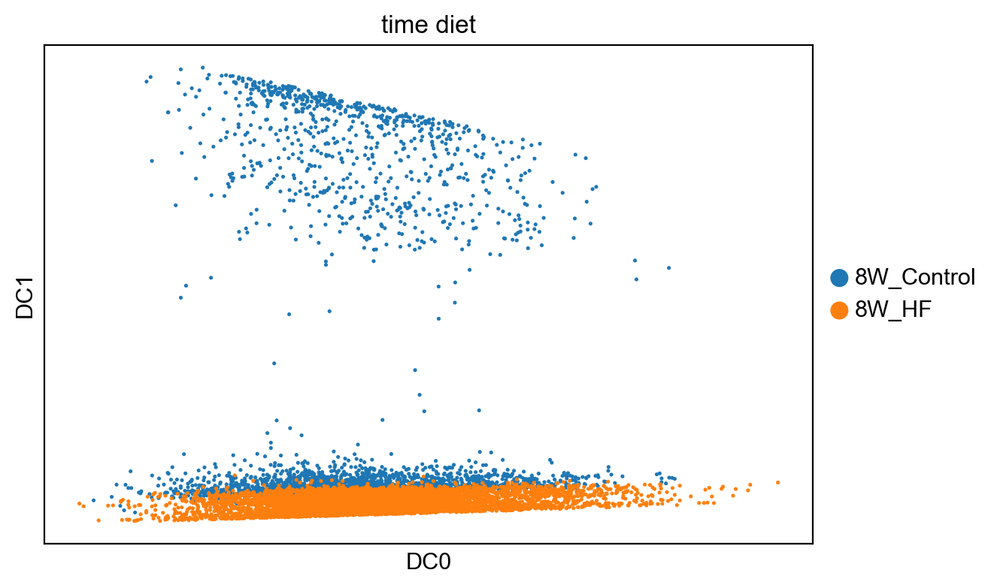

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


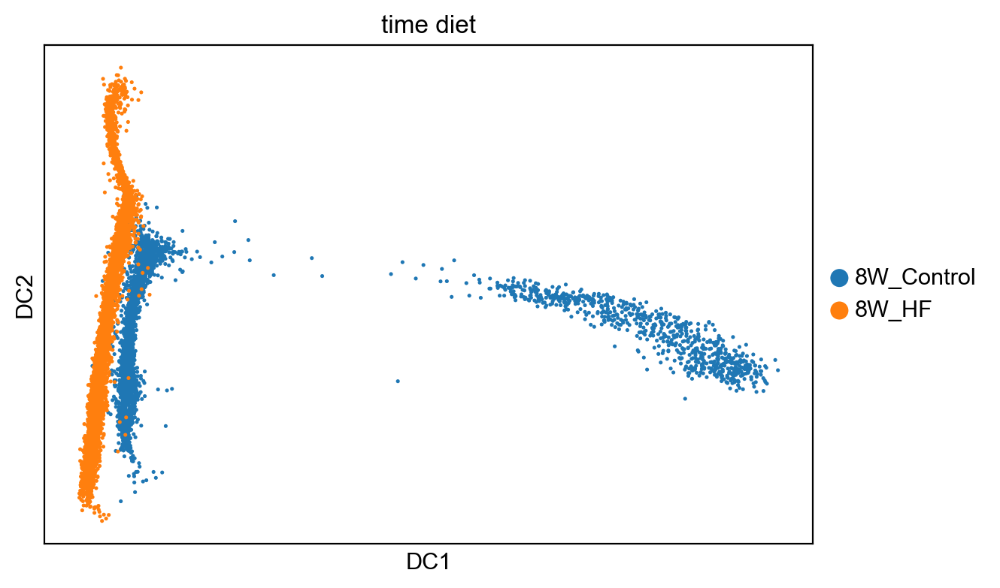

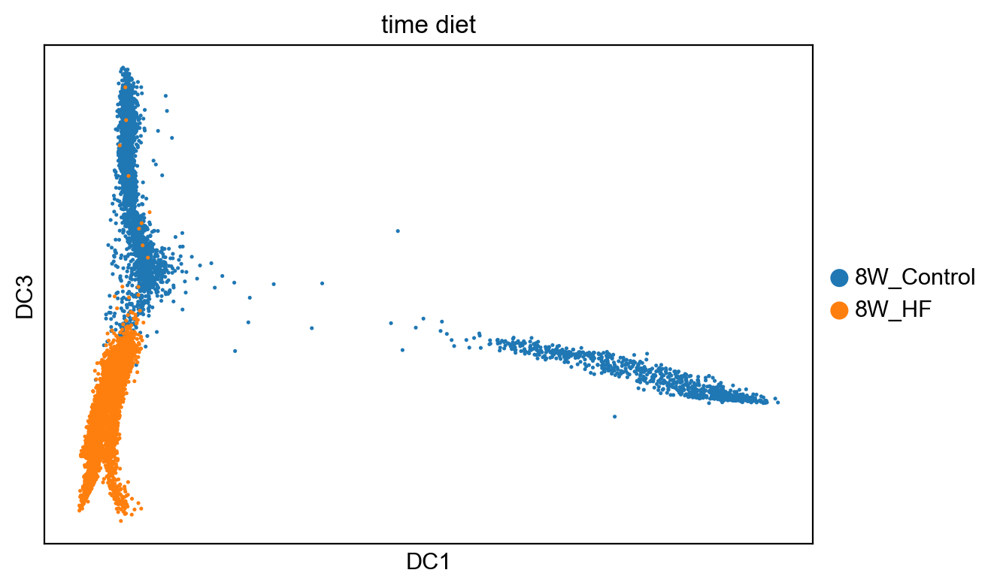

In [17]:
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[0, 1],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 2],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 3],
    
)

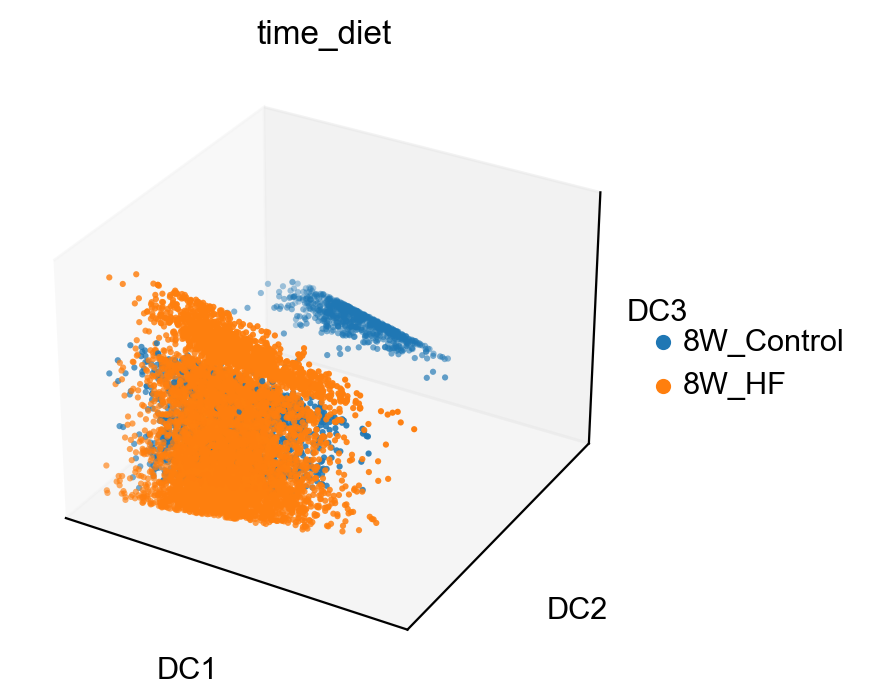

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [18]:
sc.pl.diffmap(adata, color = 'time_diet', projection = '3d')

In [19]:
scv.tl.umap(adata)

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


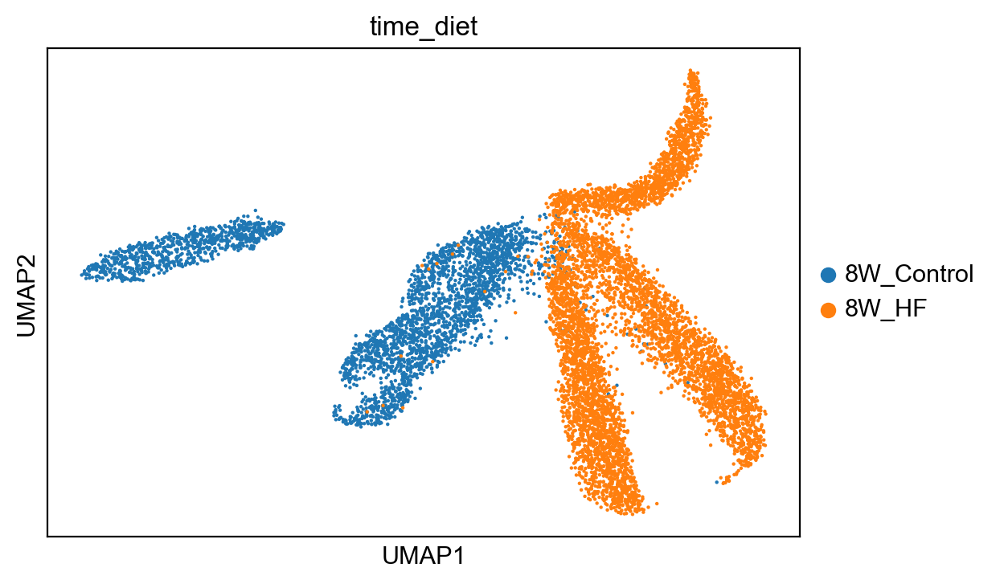

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [20]:
sc.pl.umap(adata, color=["time_diet"], size=10)

In [21]:
scv.tl.recover_dynamics(adata, n_jobs=-1) # n_jobs = -1 means that all available cores will be used

recovering dynamics (using 10/10 cores)
False
False
False
False


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


  0%|          | 0/218 [00:00<?, ?gene/s]

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: This process (pid=71815) is multi-threaded, use of fork() may lead to deadlocks in the child.
  pid = os.fork()


False
False
False
False
FalseFalse

False
False
False
False
False
False
False
FalseFalse

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
Fals

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [22]:
# mode = 'dynamical' using the likelihood-based dynamical model [Bergen et al., 2020] solves the full splicing kinetics 
# and generalizes RNA velocity estimation to transient systems. 
# It is also capable of capturing non-observed steady states.

# scv.tl.recover_dynamics must be run first
scv.tl.velocity(adata, mode='dynamical', groupby='time_diet')

computing velocities
False
False
False
False


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [23]:
scv.tl.velocity_graph(adata, n_jobs = -1)

computing velocity graph (using 10/10 cores)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


  0%|          | 0/8831 [00:00<?, ?cells/s]

    finished (0:00:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


computing velocity embedding


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


    finished (0:00:01) --> added
    'velocity_diffmap', embedded velocity vectors (adata.obsm)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Us

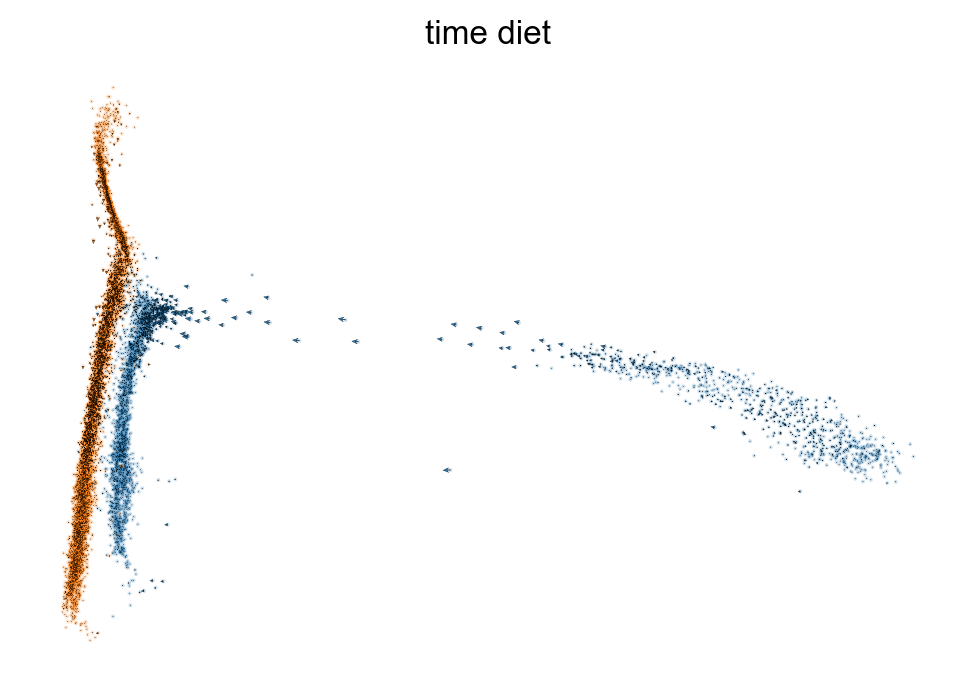

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


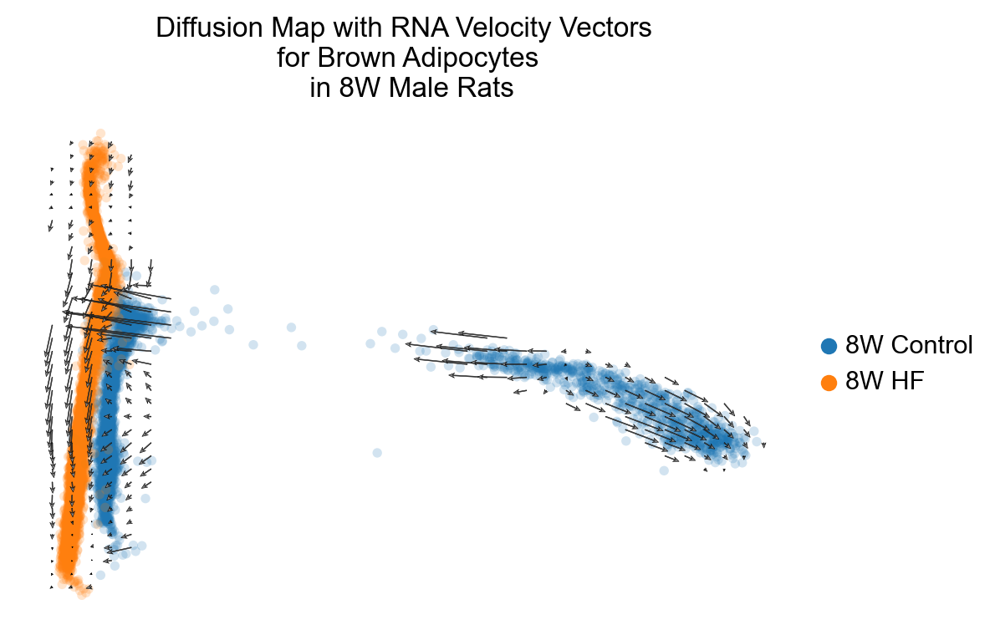

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


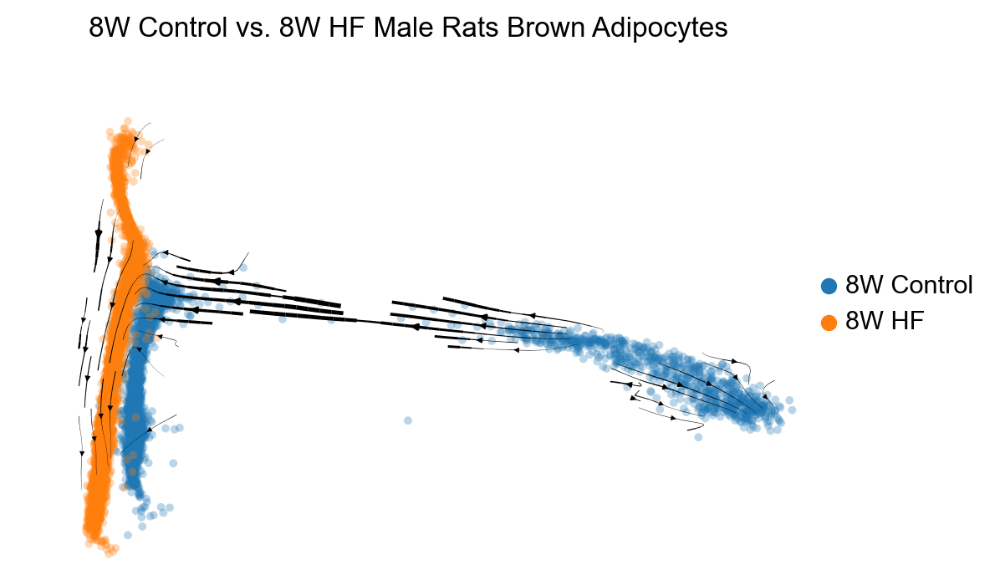

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Us

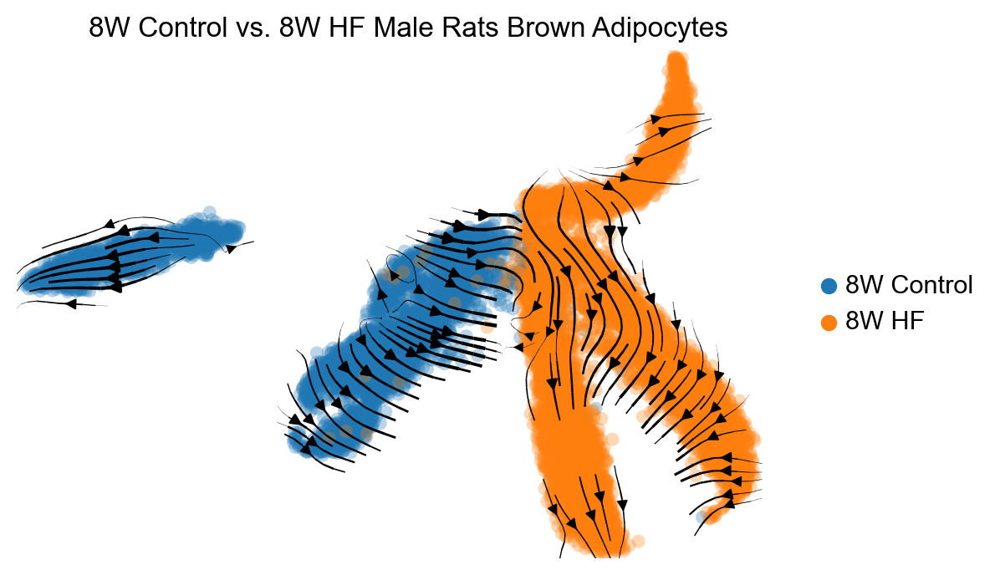

In [24]:
scv.pl.velocity_embedding(adata, basis='diffmap', color = 'time_diet',)
scv.pl.velocity_embedding_grid(adata, basis='diffmap', color = 'time_diet', arrow_length=2, arrow_size = 1.25, min_mass= 10, smooth=1,
                               density=0.75, legend_loc = 'right margin',
                               title='Diffusion Map with RNA Velocity Vectors \n for Brown Adipocytes \n in 8W Male Rats')

scv.pl.velocity_embedding_stream(adata, basis='diffmap', color = ['time_diet'], 
                                 legend_loc='right margin', title= '8W_Control vs. 8W_HF Male Rats Brown Adipocytes',
                                 arrow_size = 0.5, max_length = 1, size = 50, density= 2,
                                 ncols=1)

scv.pl.velocity_embedding_stream(adata, basis='umap', color = ['time_diet'], 
                                 legend_loc='right margin', title= '8W_Control vs. 8W_HF Male Rats Brown Adipocytes',
                                 arrow_size = 1, max_length = 4, ncols= 1)


# Starting Kinetic Rate Parameters 
### https://scvelo.readthedocs.io/en/stable/DynamicalModeling.html

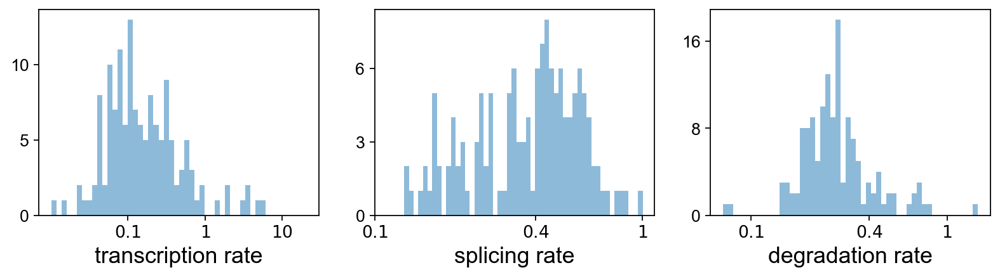

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
AABR07053830.1,0.250918,0.316324,0.080890,0.236437,9.372635,2.064671,0.907089,0.207587,0.256485,0.0,0.0,0.317108,3.059056,0.654832,0.930570,2.694420
Abca8a,0.133722,0.085273,0.470690,0.209302,8.590351,1.193061,0.072315,0.081676,0.146028,0.0,0.0,0.359720,0.251768,0.280183,1.727978,2.399556
Abcc5,0.193043,0.043522,0.237726,0.238438,9.745294,1.593663,0.052203,0.044140,0.122105,0.0,0.0,0.359621,0.188404,0.153975,2.045939,3.048659
Abcc8,0.284930,0.045145,0.215060,0.313589,8.211833,3.269449,0.085843,0.033236,0.231047,0.0,0.0,0.039977,0.239387,0.099871,0.896622,1.714563
Abcc9,0.203788,0.077681,0.159346,0.239863,5.474526,3.554190,0.140121,0.043465,0.000011,0.0,0.0,0.402200,0.555983,0.156988,2.350906,1.853986


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [25]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

In [26]:
#scv.get_df(adata, 'fit*', dropna=True).sort_values('fit_likelihood').head(25)

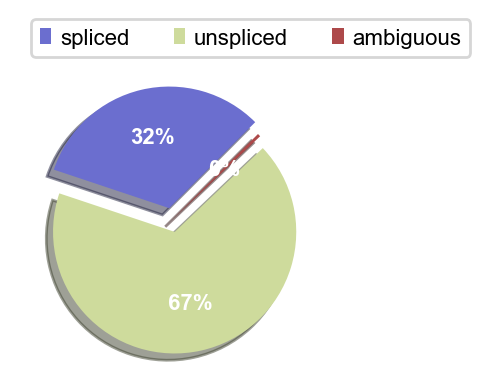

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [27]:
scv.pl.proportions(adata)

# Starting Latent Time 
### https://scvelo.readthedocs.io/en/stable/DynamicalModeling.html

computing terminal states


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


T_roots shape: (8831, 8831)
T_roots (sample): <Compressed Sparse Row sparse matrix of dtype 'float32'
	with 5 stored elements and shape (5, 5)>
  Coords	Values
  (1, 4)	0.00017586896137800068
  (1, 3)	0.00046661391388624907
  (3, 1)	0.000444141129264608
  (4, 3)	5.232854891801253e-05
  (4, 1)	1.5197242646536324e-05
Eigenvectors_roots (first): [0.0854920556 0.330879274  0.0140331399 0.3435111698 0.062105904 ]
Eigenvectors_roots (second): [0.0087833527 0.0027539643 0.0027274966 0.0020795975 0.0023522186]
Roots: [0.6312410933 0.0984544896 0.6112181042 ... 0.003007249  0.0071603289
 0.0034565968]
Roots_after_scale: [0.4521917208 0.0692149689 0.4377988302 ... 0.0006057473 0.003591057
 0.0009287467]
Roots_after_verify_roots: [0.4521917208 0.0692149689 0.4377988302 ... 0.0006057473 0.003591057
 0.0009287467]
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points',

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Us

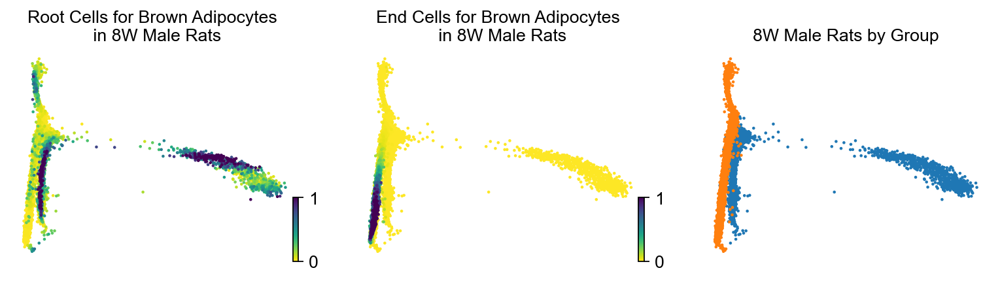

In [28]:
scv.tl.terminal_states(adata)
scv.pl.scatter(adata, color=["root_cells", "end_points",'time_diet'], basis = 'diffmap', title=['Root Cells for Brown Adipocytes \n in 8W Male Rats', 'End Cells for Brown Adipocytes \n in 8W Male Rats','8W Male Rats by Group'])

computing latent time using root_cells, end_points as prior


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


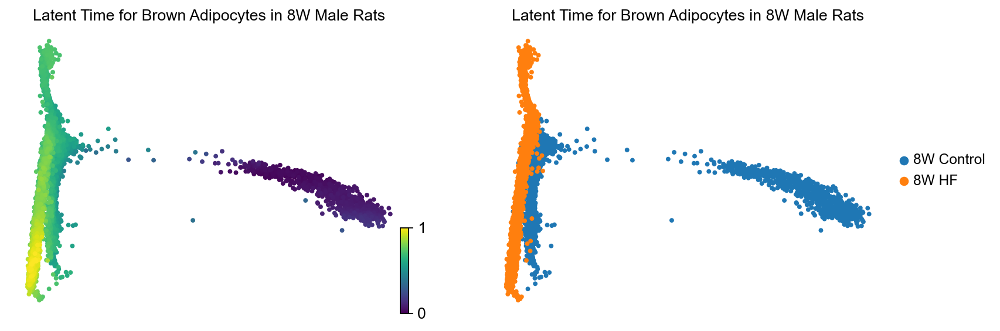

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.u

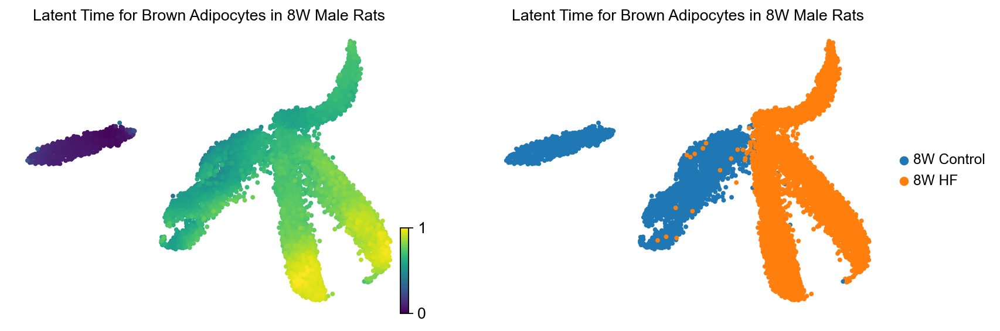

In [29]:
scv.tl.latent_time(adata, end_key='end_points', root_key='root_cells')
scv.pl.scatter(adata, color=['latent_time','time_diet'], color_map='viridis', size=50, legend_loc='right margin',basis = 'diffmap', title='Latent Time for Brown Adipocytes in 8W Male Rats')
scv.pl.umap(adata, color=['latent_time','time_diet'], color_map='viridis', size=50, legend_loc ='right_margin', title ='Latent Time for Brown Adipocytes in 8W Male Rats')


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.u

[]

<Figure size 1000x2000 with 0 Axes>

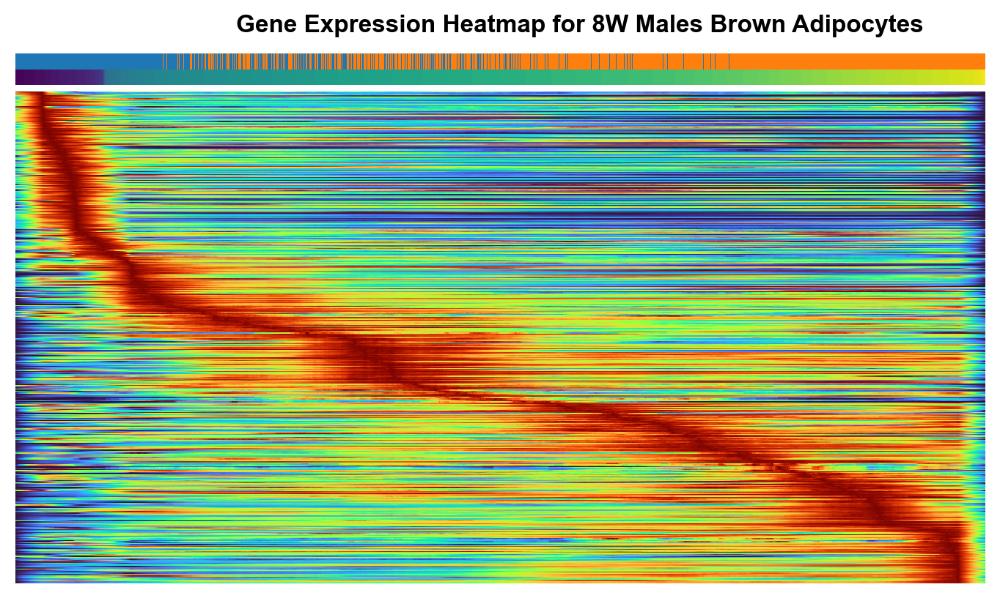

In [40]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[0:500]
#scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color=['time_diet','latent_time'], n_convolve=500, context='paper', colorbar=True, color_map='turbo')

plt.figure(figsize=(10, 20))
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[0:500]
heatmap = scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color=['time_diet', 'latent_time'], 
                    n_convolve=500, context='paper', colorbar=True, color_map='turbo', show=False)

plt.suptitle("Gene Expression Heatmap for 8W Males Brown Adipocytes", fontsize=12, fontweight='bold', y=1.02)
heatmap.ax_heatmap.set_yticklabels([]) 
heatmap.ax_heatmap.set_yticks([]) 

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.u

<Figure size 1000x2000 with 0 Axes>

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


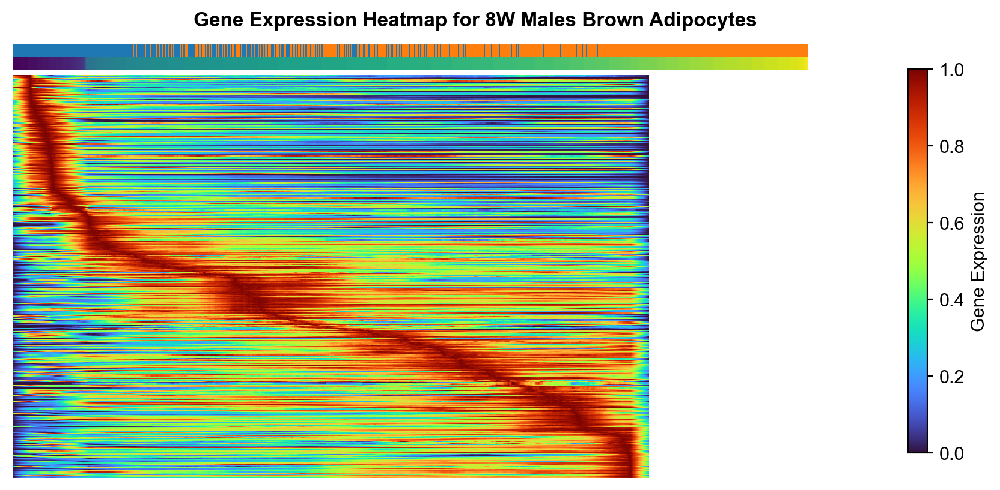

In [42]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[0:500]

plt.figure(figsize=(10, 20))
heatmap = scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color=['time_diet', 'latent_time'], 
                    n_convolve=500, context='paper', colorbar=True, color_map='turbo', show=False)
plt.suptitle("Gene Expression Heatmap for 8W Males Brown Adipocytes", fontsize=12, fontweight='bold', y=1.02)
heatmap.ax_heatmap.set_yticklabels([]) 
heatmap.ax_heatmap.set_yticks([]) 

ms_data = adata.layers['Ms']  # Extract 'Ms' data (which is the default used by scVelo)
norm = plt.Normalize(vmin=(np.min(ms_data)/np.max(ms_data)), vmax=(np.max(ms_data)/np.max(ms_data)))  # Normalize the data range to make it a colormap
cmap_ms = plt.cm.turbo  # Use the same colormap as the heatmap
sm = plt.cm.ScalarMappable(cmap=cmap_ms, norm=norm)
sm.set_array([])  # Empty array for the colorbar

# Add the colorbar to the heatmap axes (ax_heatmap)
cbar = plt.colorbar(sm, ax=heatmap.ax_heatmap, orientation="vertical", label="Gene Expression", shrink=0.75)  
cbar.ax.set_position([0.95, 0.1, 0.03, 0.8])

# Show the plot with the additional colorbar
plt.show()


In [31]:
adata

AnnData object with n_obs × n_vars = 8831 × 2000
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'time_diet', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'latent_time_categorical'
    var: 'n_cells', 'gene_coun

In [32]:
adata.var['fit_likelihood'].sort_values(ascending=False)

Fasn       0.650753
Gpd1       0.499200
Stimate    0.492262
Resf1      0.472392
Acly       0.466219
             ...   
Zscan20         NaN
Zscan25         NaN
Zswim5          NaN
Zyg11b          NaN
rnf141          NaN
Name: fit_likelihood, Length: 2000, dtype: float64

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Us

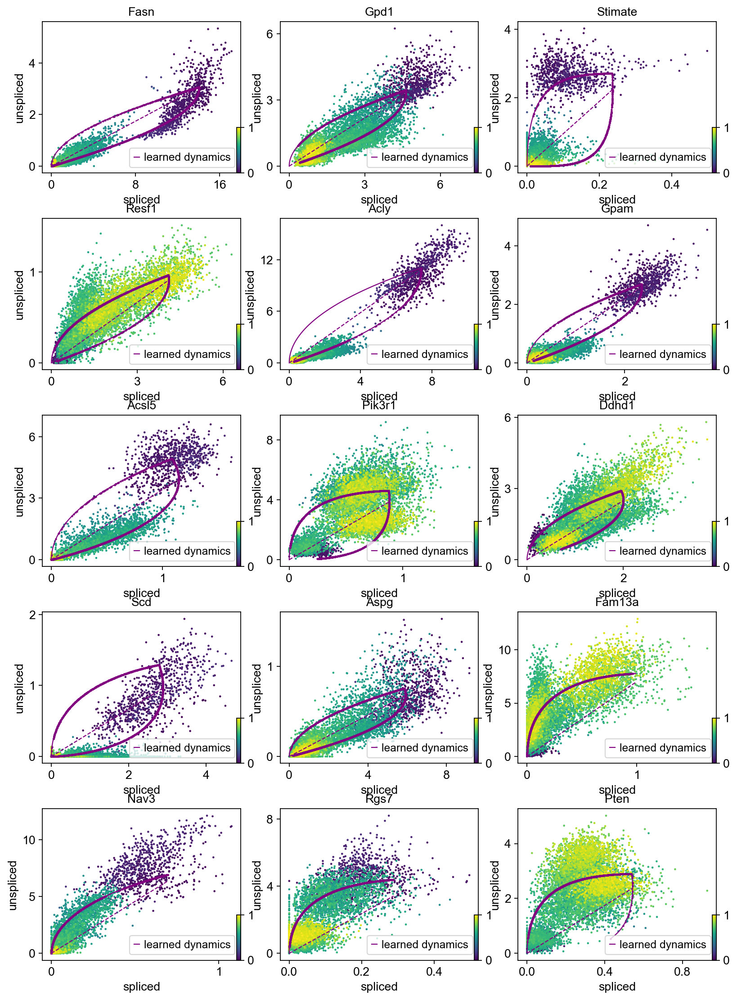

In [33]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=3, frameon=True,colorbar=True, 
               color_map='viridis', color = 'latent_time',figsize=(14,12))



/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Us

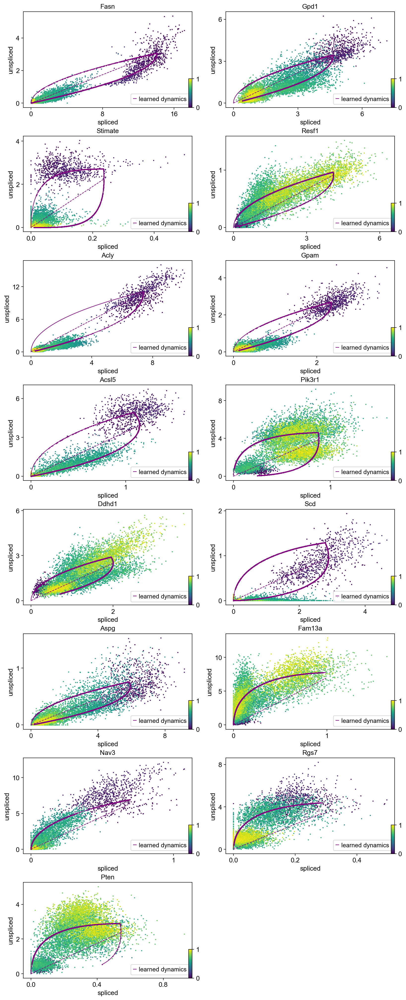

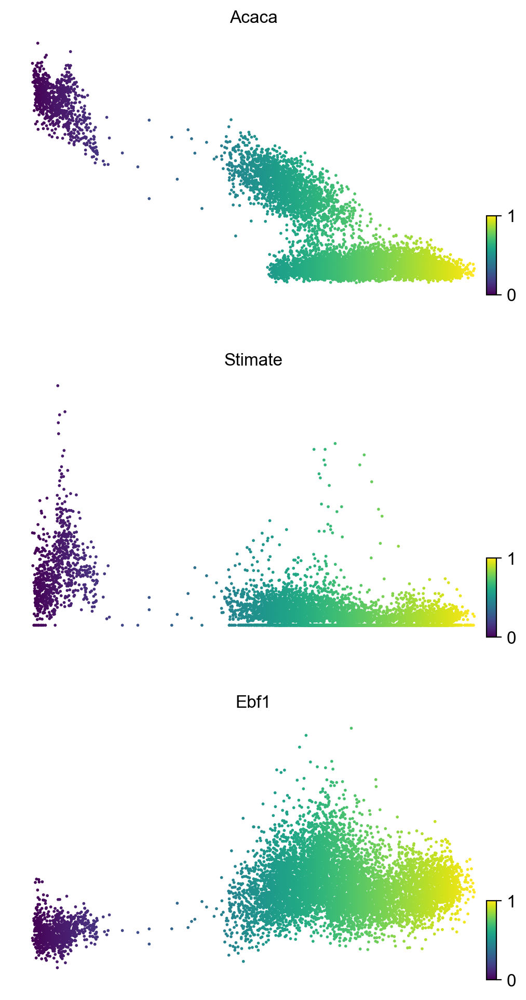

In [34]:
var_names = ['Acaca',  'Stimate', 'Ebf1']
scv.pl.scatter(adata, top_genes[:15], frameon=True, color='latent_time', color_map='viridis',ncols=2)
scv.pl.scatter(adata, x='latent_time', y=var_names, frameon=False, colorbar=True, color_map='viridis', color = 'latent_time',ncols=1)



In [35]:
scv.tl.rank_dynamical_genes(adata, groupby='time_diet')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)



ranking genes by cluster-specific likelihoods
False
False
False
False
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/core/_anndata.py:245: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,8W_Control,8W_HF
0,Acsl5,Resf1
1,Fasn,Pik3r1
2,Ddhd1,Dgat2
3,Gpd1,Fam13a
4,Pten,Pdk4


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/env

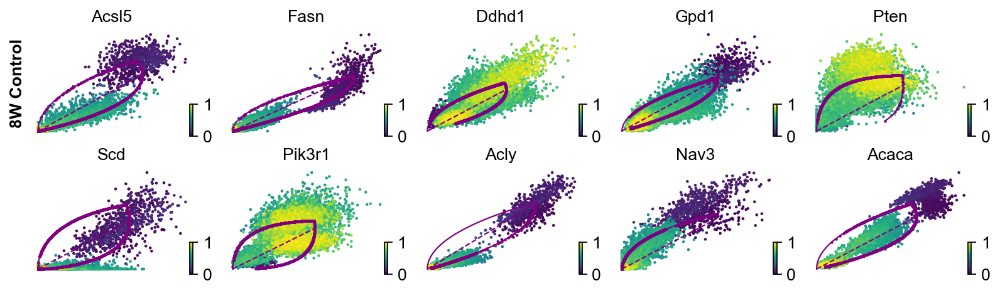

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/env

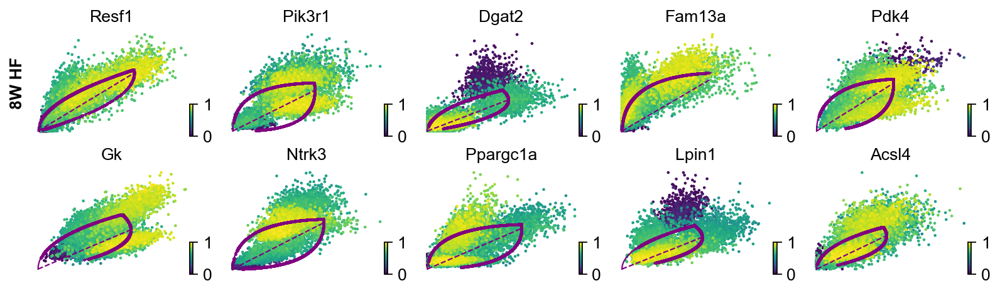

In [36]:
for cluster in ['8W_Control', '8W_HF' ]:
    scv.pl.scatter(adata, df[cluster][:10], ylabel=cluster, color ='latent_time',
                   color_map='viridis', frameon=False, ncols=5)

